In [1]:
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
#52 - 187
fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_flair[52:187]), cmap = 'bone')

fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_seg[52:187]))

fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_t1w[52:187]), cmap = 'bone')

fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_t2w[52:187]), cmap = 'bone')

fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_t1ce[52:187]), cmap = 'bone')

path = 'RSNA_ASNR_MICCAI_BraTS2021_TrainingData_16July2021/'
sample1 = nib.load(path + 'BraTS2021_00000/BraTS2021_00000_flair.nii.gz').get_fdata()
sample2 = nib.load(path + 'BraTS2021_01164/BraTS2021_01164_flair.nii.gz').get_fdata()
sample3 = nib.load(path + 'BraTS2021_00443/BraTS2021_00443_flair.nii.gz').get_fdata()
import skimage.transform as skTrans
sample1 = skTrans.resize(sample1, (135, 240, 155), order=1, preserve_range=True)
plt.imshow(sample1[len(sample1)//2])
print(sample1.shape)
print(sample2.shape)
print(sample3.shape)

import pandas as pd
data = pd.read_csv('BraTS21-17_Mapping.csv')
data.head()

data = data.sort_values(by='BraTS2021')
data

data.drop(data[pd.isnull(data.BraTS2021)].index, inplace=True)
data

# RSNA_ASNR_MICCAI_BraTS2021_TrainingData_16July2021/BraTS2021_00000/BraTS2021_00000_t2.nii.gz
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
path = 'RSNA_ASNR_MICCAI_BraTS2021_TrainingData_16July2021/'
filename = ['flair', 't1', 't2', 't1ce', 'seg']
opath = path + data['BraTS2021'][0] + '/' + data['BraTS2021'][0] + '_' + filename[-1] + '.nii.gz'
xfile = nib.load(opath).get_fdata()[52:187]
plt.imshow(np.rot90(xfile[len(xfile)//2]), cmap = 'bone_r')!pip install monai tqdm
!pip install 'monai[all]'
!python -c "import monai" || pip install -q "monai-weekly[nibabel, tqdm]"
!python -c "import matplotlib" || pip install -q matplotlib
!pip install self-attention-cv==1.2.3
%matplotlib inline

import os
import shutil
import tempfile

from monai.config import print_config
from monai.data import DataLoader
from monai.losses import DiceLoss, DiceCELoss
from monai.metrics import DiceMetric
from monai.networks.nets import UNet
from monai.transforms import (
    Activations,
    AsChannelFirstd,
    AsDiscrete,
    CenterSpatialCropd,
    Compose,
    LoadImaged,
    MapTransform,
    NormalizeIntensityd,
    Orientationd,
    RandFlipd,
    RandScaleIntensityd,
    RandShiftIntensityd,
    RandSpatialCropd,
    Spacingd,
    ToTensord,
)
from monai.utils import set_determinism

import torch

print_config()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 8.4 MB 4.7 MB/s 
     |████████████████████████████████| 31.0 MB 75.1 MB/s 
     |████████████████████████████████| 2.0 MB 57.8 MB/s 
     |████████████████████████████████| 316 kB 53.4 MB/s 
     |████████████████████████████████| 125 kB 51.2 MB/s 
     |████████████████████████████████| 17.0 MB 37.4 MB/s 
     |████████████████████████████████| 259 kB 42.4 MB/s 
     |████████████████████████████████| 4.7 MB 44.5 MB/s 
     |████████████████████████████████| 87 kB 5.4 MB/s 
     |████████████████████████████████| 95.3 MB 33 kB/s 
     |████████████████████████████████| 54.5 MB 11 kB/s 
     |████████████████████████████████| 70.6 MB 10 kB/s 
     |████████████████████████████████| 15.0 MB 29.4 MB/s 
     |████████████████████████████████| 16.6 MB 19.

In [2]:
test_flair=nib.load('RSNA_ASNR_MICCAI_BraTS2021_TrainingData_16July2021/BraTS2021_00000/BraTS2021_00000_flair.nii.gz').get_fdata()
test_seg=nib.load('RSNA_ASNR_MICCAI_BraTS2021_TrainingData_16July2021/BraTS2021_00000/BraTS2021_00000_seg.nii.gz').get_fdata()
test_t1w=nib.load('RSNA_ASNR_MICCAI_BraTS2021_TrainingData_16July2021/BraTS2021_00000/BraTS2021_00000_t1.nii.gz').get_fdata()
test_t1ce=nib.load('RSNA_ASNR_MICCAI_BraTS2021_TrainingData_16July2021/BraTS2021_00000/BraTS2021_00000_t1ce.nii.gz').get_fdata()
test_t2w=nib.load('RSNA_ASNR_MICCAI_BraTS2021_TrainingData_16July2021/BraTS2021_00000/BraTS2021_00000_t2.nii.gz').get_fdata()

Text(0.5, 1.0, 'T2W')

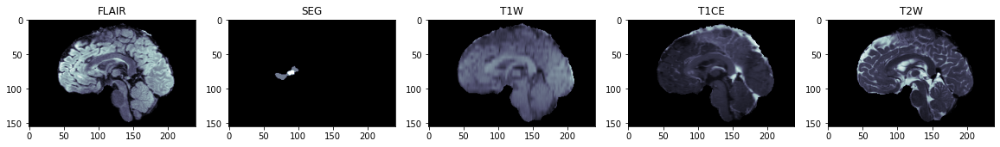

In [3]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize = (20, 48))
ax1.imshow(np.rot90(test_flair[test_flair.shape[1]//2, :, :]), cmap = 'bone')
ax1.set_title('FLAIR')
ax2.imshow(np.rot90(test_seg[test_flair.shape[1]//2, :, :]), cmap = 'bone')
ax2.set_title('SEG')
ax3.imshow(np.rot90(test_t1w[test_flair.shape[1]//2 , :, :]), cmap = 'bone')
ax3.set_title('T1W')
ax4.imshow(np.rot90(test_t1ce[test_flair.shape[1]//2, :, :]), cmap = 'bone')
ax4.set_title('T1CE')
ax5.imshow(np.rot90(test_t2w[test_flair.shape[1]//2 , :, :]), cmap = 'bone')
ax5.set_title('T2W')

Text(0.5, 1.0, 'T2W')

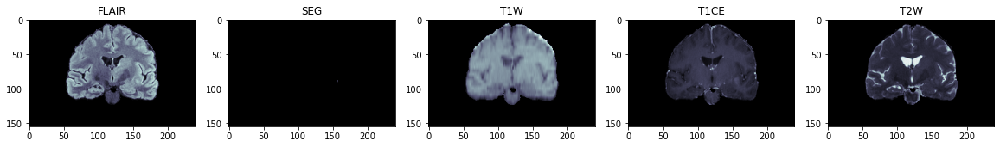

In [4]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize = (20, 48))
ax1.imshow(np.rot90(test_flair[:, test_flair.shape[1]//2, :]), cmap = 'bone')
ax1.set_title('FLAIR')
ax2.imshow(np.rot90(test_seg[:, test_flair.shape[1]//2, :]), cmap = 'bone')
ax2.set_title('SEG')
ax3.imshow(np.rot90(test_t1w[:, test_flair.shape[1]//2 ,:]), cmap = 'bone')
ax3.set_title('T1W')
ax4.imshow(np.rot90(test_t1ce[:, test_flair.shape[1]//2, :]), cmap = 'bone')
ax4.set_title('T1CE')
ax5.imshow(np.rot90(test_t2w[:, test_flair.shape[1]//2 , :]), cmap = 'bone')
ax5.set_title('T2W')

Text(0.5, 1.0, 'T2W')

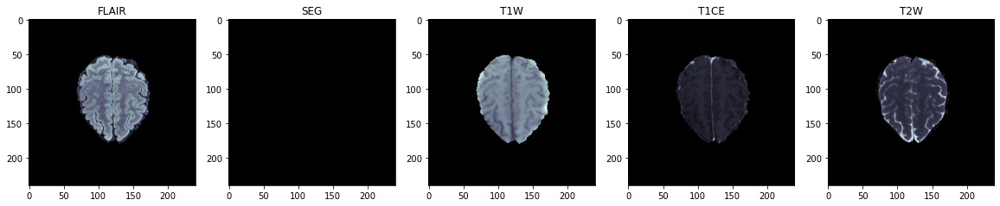

In [5]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize = (20, 48))
ax1.imshow(np.rot90(test_flair[:, :, test_flair.shape[1]//2]), cmap = 'bone')
ax1.set_title('FLAIR')
ax2.imshow(np.rot90(test_seg[:, :, test_flair.shape[1]//2]), cmap = 'bone')
ax2.set_title('SEG')
ax3.imshow(np.rot90(test_t1w[:, :, test_flair.shape[1]//2]), cmap = 'bone')
ax3.set_title('T1W')
ax4.imshow(np.rot90(test_t1ce[:, :, test_flair.shape[1]//2]), cmap = 'bone')
ax4.set_title('T1CE')
ax5.imshow(np.rot90(test_t2w[:, :, test_flair.shape[1]//2]), cmap = 'bone')
ax5.set_title('T2W')

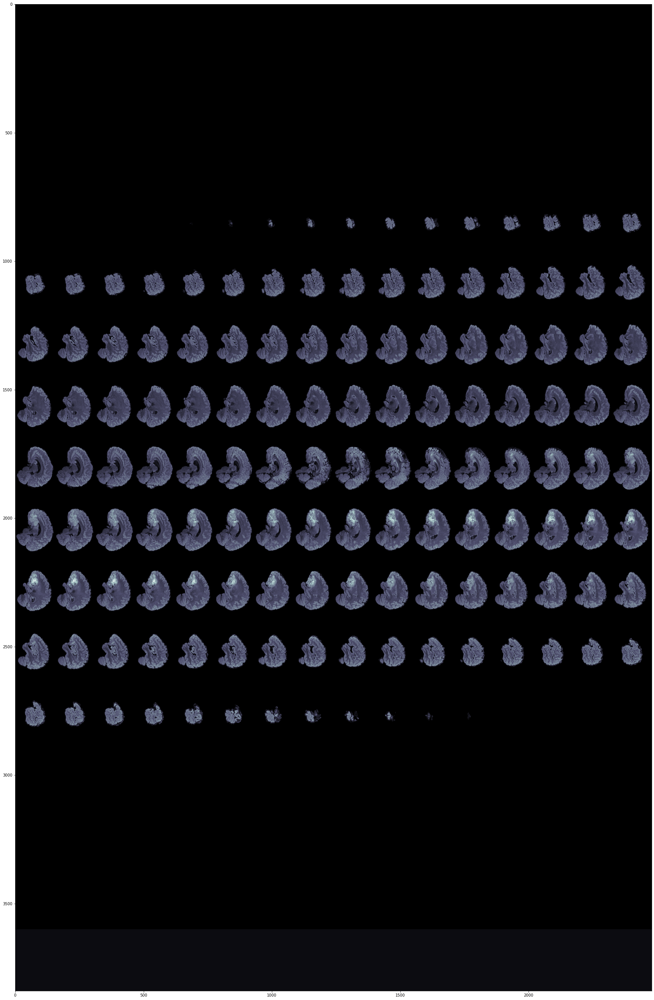

In [6]:
from skimage.util._montage import montage
fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_flair), cmap = 'bone')

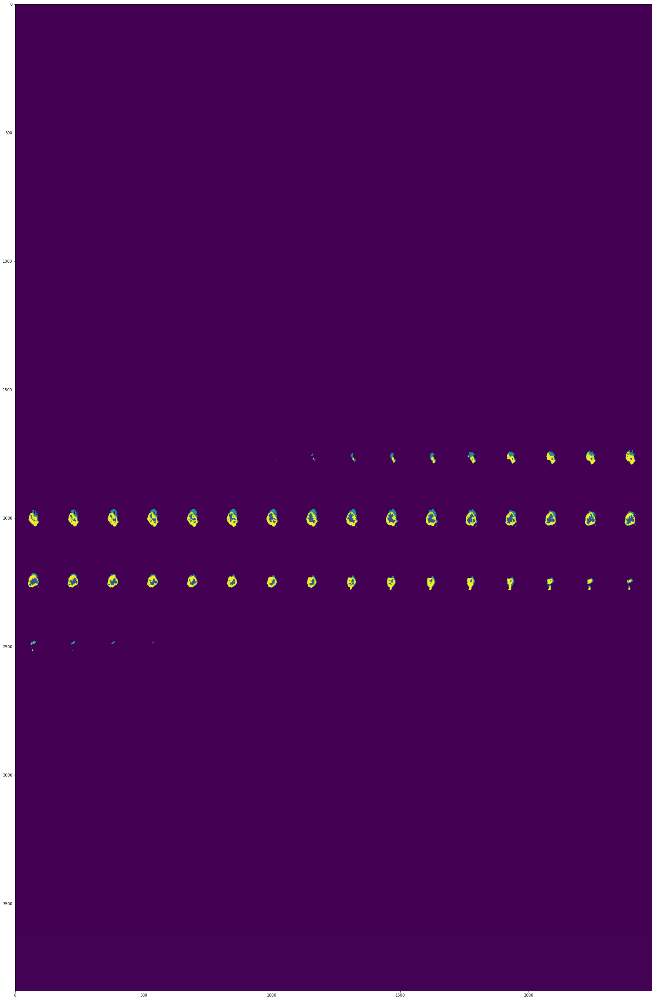

In [7]:
fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_seg))

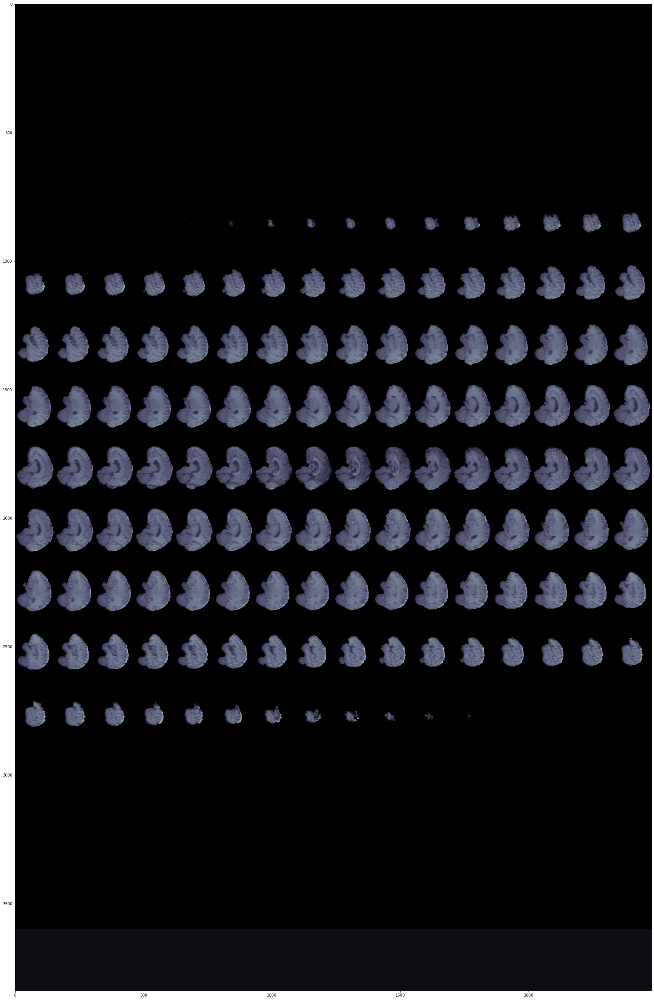

In [8]:
fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_t1w), cmap = 'bone')

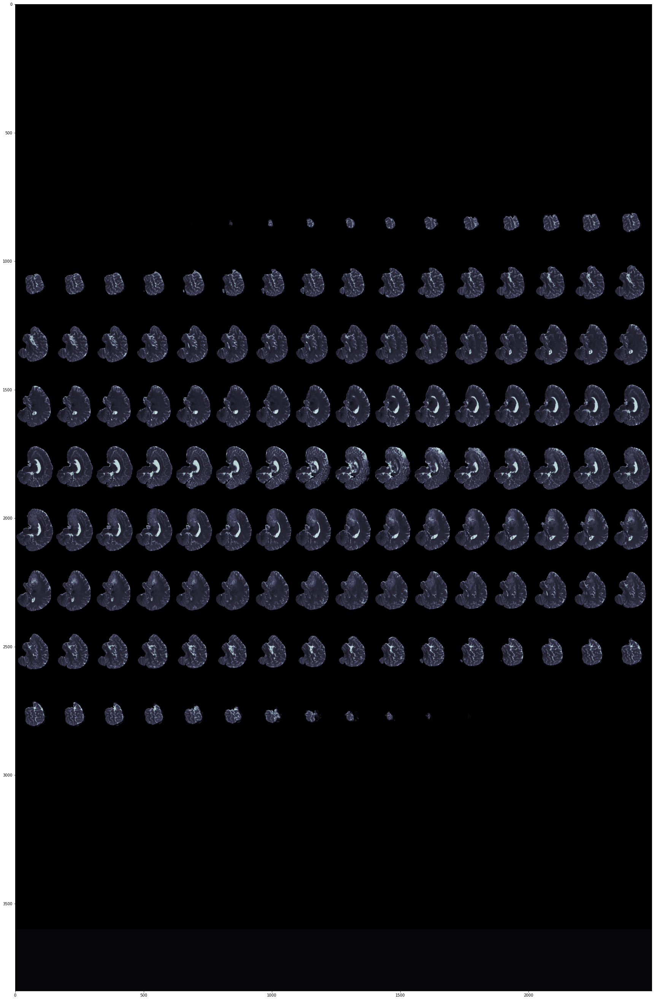

In [9]:
fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_t2w), cmap = 'bone')

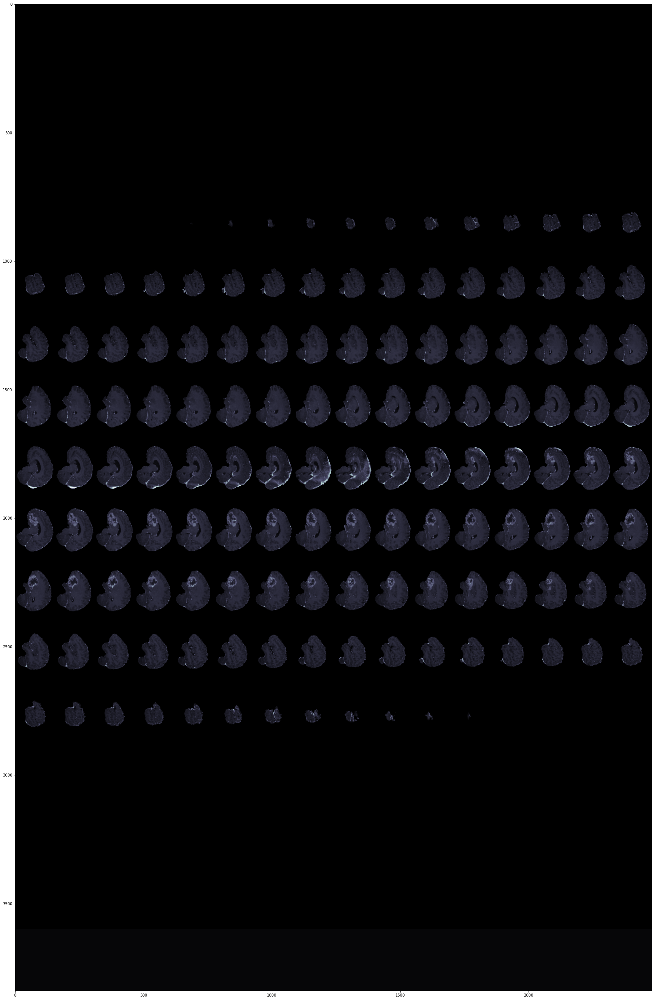

In [10]:
fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_t1ce), cmap = 'bone')

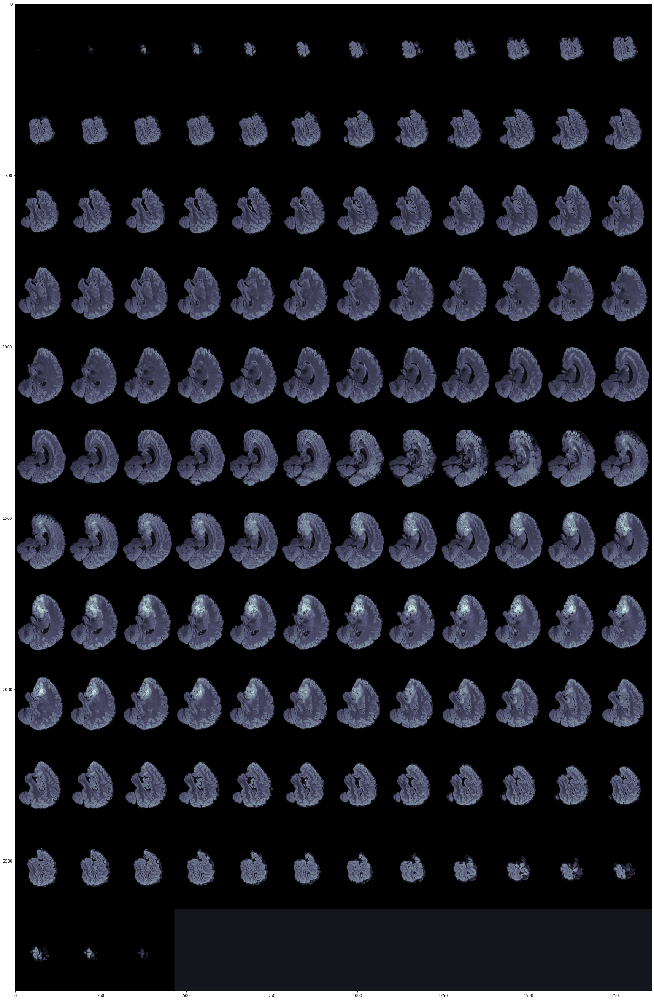

In [17]:
#52 - 187
fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_flair[52:187]), cmap = 'bone')

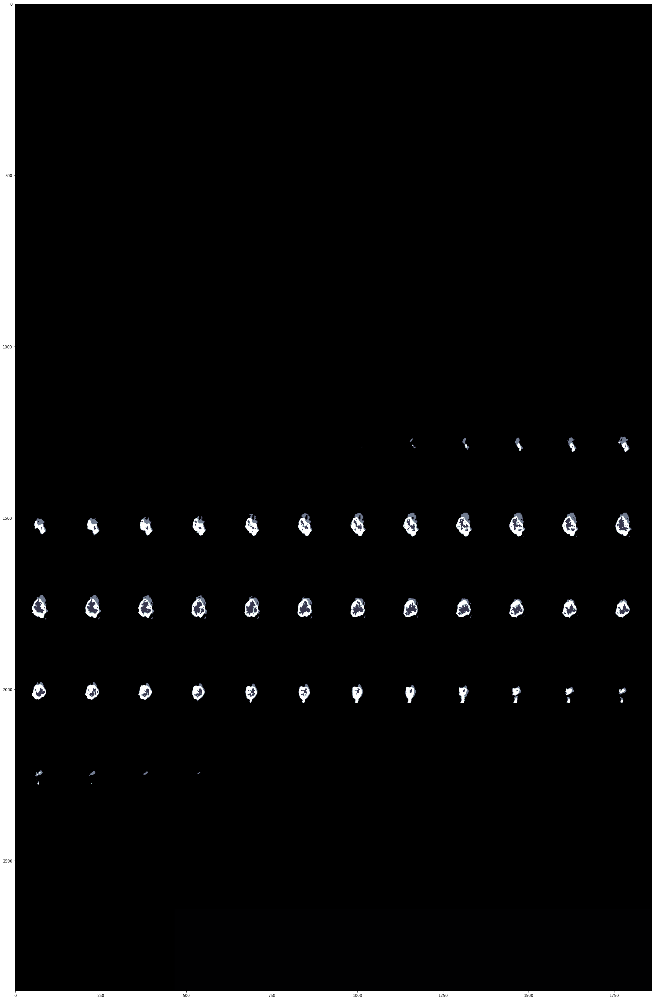

In [18]:
fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_seg[52:187]))

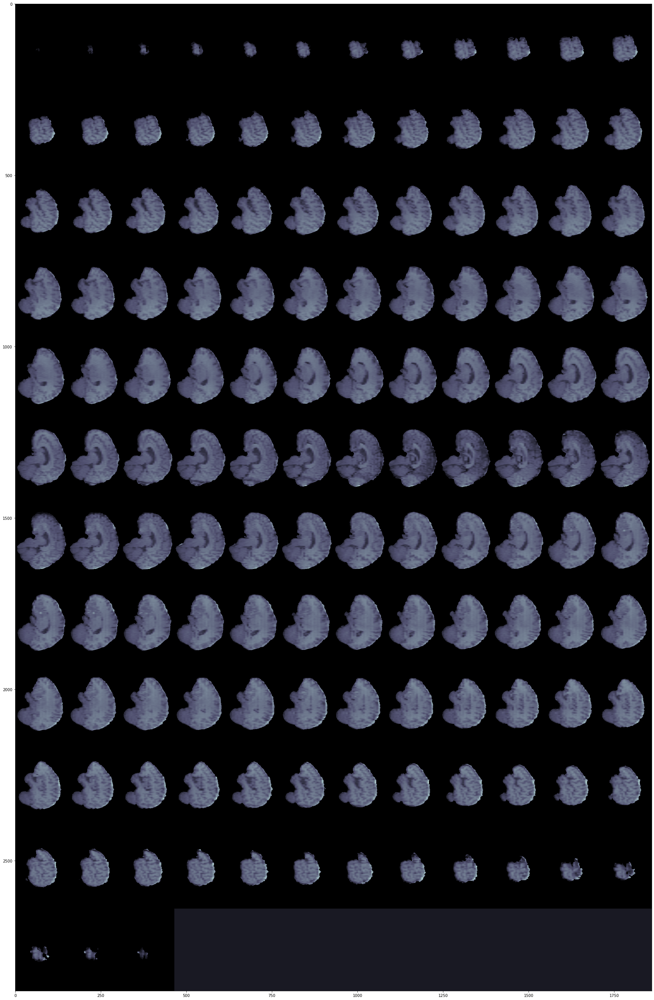

In [19]:
fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_t1w[52:187]), cmap = 'bone')

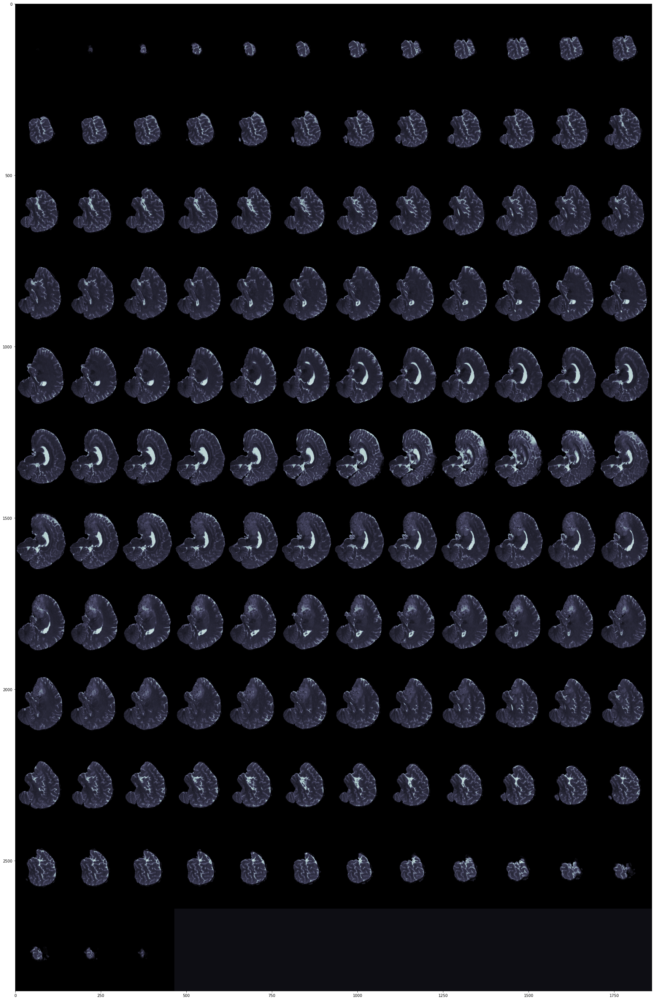

In [20]:
fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_t2w[52:187]), cmap = 'bone')

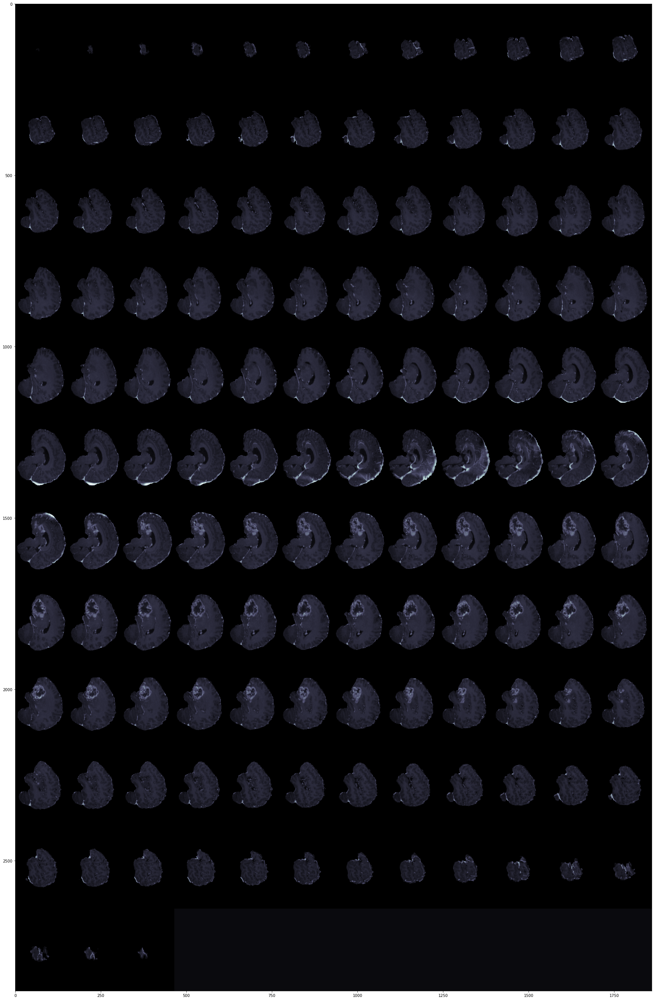

In [21]:
fig, ax1 = plt.subplots(1, 1, figsize = (30, 230))
ax1.imshow(montage(test_t1ce[52:187]), cmap = 'bone')

(135, 240, 155)
(240, 240, 155)
(240, 240, 155)


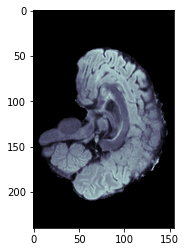

In [22]:
path = 'RSNA_ASNR_MICCAI_BraTS2021_TrainingData_16July2021/'
sample1 = nib.load(path + 'BraTS2021_00000/BraTS2021_00000_flair.nii.gz').get_fdata()
sample2 = nib.load(path + 'BraTS2021_01164/BraTS2021_01164_flair.nii.gz').get_fdata()
sample3 = nib.load(path + 'BraTS2021_00443/BraTS2021_00443_flair.nii.gz').get_fdata()
import skimage.transform as skTrans
sample1 = skTrans.resize(sample1, (135, 240, 155), order=1, preserve_range=True)
plt.imshow(sample1[len(sample1)//2])
print(sample1.shape)
print(sample2.shape)
print(sample3.shape)

In [2]:
import pandas as pd
data = pd.read_csv('BraTS21-17_Mapping.csv')
data.head()

,BraTS2021,BraTS2020,BraTS2019,BraTS2018,BraTS2017,Cohort Name (if publicly available),Site No (represents the originating institution),Local ID
0,BraTS2021_01163,NaN,NaN,NaN,NaN,ACRIN-FMISO-Brain (ACRIN 6684),19,ACRIN-FMISO-Brain-004
1,BraTS2021_01164,NaN,NaN,NaN,NaN,ACRIN-FMISO-Brain (ACRIN 6684),19,ACRIN-FMISO-Brain-034
2,BraTS2021_01165,NaN,NaN,NaN,NaN,ACRIN-FMISO-Brain (ACRIN 6684),19,ACRIN-FMISO-Brain-036
3,BraTS2021_01166,NaN,NaN,NaN,NaN,ACRIN-FMISO-Brain (ACRIN 6684),19,ACRIN-FMISO-Brain-042
4,BraTS2021_00101,NaN,NaN,NaN,NaN,CPTAC-GBM,20,C3L-00016


In [3]:
data = data.sort_values(by='BraTS2021')
data

,BraTS2021,BraTS2020,BraTS2019,BraTS2018,BraTS2017,Cohort Name (if publicly available),Site No (represents the originating institution),Local ID
868,BraTS2021_00000,NaN,NaN,NaN,NaN,Private Collection,18,NaN
869,BraTS2021_00002,NaN,NaN,NaN,NaN,Private Collection,18,NaN
870,BraTS2021_00003,NaN,NaN,NaN,NaN,Private Collection,18,NaN
871,BraTS2021_00005,NaN,NaN,NaN,NaN,Private Collection,18,NaN
872,BraTS2021_00006,NaN,NaN,NaN,NaN,Private Collection,18,NaN
...,...,...,...,...,...,...,...,...
863,BraTS2021_01666,BraTS20_Training_335,BraTS19_TCIA13_634_1,Brats18_TCIA13_634_1,Brats17_TCIA_634_1,TCGA-LGG,15,TCGA-HT-A61A
1251,NaN,BraTS20_Training_353,NaN,NaN,NaN,IvyGAP,16,W36
1252,NaN,BraTS20_Training_354,NaN,NaN,NaN,IvyGAP,16,W43
1253,NaN,BraTS20_Training_355,NaN,NaN,NaN,IvyGAP,16,W39


In [4]:
data.drop(data[pd.isnull(data.BraTS2021)].index, inplace=True)
data

,BraTS2021,BraTS2020,BraTS2019,BraTS2018,BraTS2017,Cohort Name (if publicly available),Site No (represents the originating institution),Local ID
868,BraTS2021_00000,NaN,NaN,NaN,NaN,Private Collection,18,NaN
869,BraTS2021_00002,NaN,NaN,NaN,NaN,Private Collection,18,NaN
870,BraTS2021_00003,NaN,NaN,NaN,NaN,Private Collection,18,NaN
871,BraTS2021_00005,NaN,NaN,NaN,NaN,Private Collection,18,NaN
872,BraTS2021_00006,NaN,NaN,NaN,NaN,Private Collection,18,NaN
...,...,...,...,...,...,...,...,...
696,BraTS2021_01662,BraTS20_Training_154,BraTS19_TMC_15477_1,NaN,NaN,Private Collection,4,NaN
860,BraTS2021_01663,BraTS20_Training_332,BraTS19_TCIA13_653_1,Brats18_TCIA13_653_1,Brats17_TCIA_653_1,TCGA-LGG,15,TCGA-HT-8111
861,BraTS2021_01664,BraTS20_Training_333,BraTS19_TCIA13_642_1,Brats18_TCIA13_642_1,Brats17_TCIA_642_1,TCGA-LGG,15,TCGA-HT-8114
862,BraTS2021_01665,BraTS20_Training_334,BraTS19_TCIA13_624_1,Brats18_TCIA13_624_1,Brats17_TCIA_624_1,TCGA-LGG,15,TCGA-HT-8563


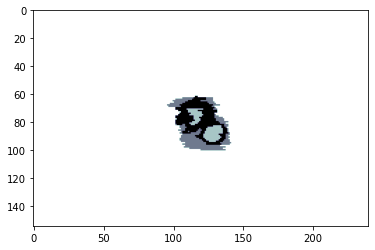

In [10]:
# RSNA_ASNR_MICCAI_BraTS2021_TrainingData_16July2021/BraTS2021_00000/BraTS2021_00000_t2.nii.gz
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
path = 'RSNA_ASNR_MICCAI_BraTS2021_TrainingData_16July2021/'
filename = ['flair', 't1', 't2', 't1ce', 'seg']
opath = path + data['BraTS2021'][0] + '/' + data['BraTS2021'][0] + '_' + filename[-1] + '.nii.gz'
xfile = nib.load(opath).get_fdata()[52:187]
plt.imshow(np.rot90(xfile[len(xfile)//2]), cmap = 'bone_r')